In [25]:
import networkx as nx
import pandas as pd
from matplotlib import pyplot as plt
import glob

%matplotlib inline

In [26]:
def get_data(filename):
    return pd.read_csv(filename)

In [27]:
def clean_dataframe(dataframe):
    dataframe['agent_name'] = 'A' + dataframe['V2'].astype(str)
    dataframe['diff_avg'] = dataframe['avg_pos'] - dataframe['avg_neg']
    return dataframe

In [28]:
def get_val_map(dataframe):
    """Get dictionary of Agent ID and difference of means"""
    return dict(zip(dataframe.agent_name, dataframe.diff_avg))

In [29]:
def create_graph_from_edge_list(filename):
    return nx.read_edgelist(filename)

In [30]:
def get_values(G, val_map):
    return [val_map.get(node) for node in G.nodes()]

In [31]:
def plot_network(G):
    nx.draw_networkx(G,
                     cmap=plt.get_cmap('jet'),
                     node_color=values,
                     pos=nx.circular_layout(G))
    plt.show()

In [32]:
def get_time_from_filename(filename):
    num = int(filename.split('/')[-1].replace('.csv', '').replace('t_', ''))
    num_format_4 = '{0:04d}'.format(num)
    return "{}.png".format(num_format_4)

In [37]:
def plot_graph(filename, save=False):
    data = get_data(filename)
    data = clean_dataframe(data)

    val_map = get_val_map(data)

    G = create_graph_from_edge_list(edge_list_file)

    values = get_values(G, val_map)
    plt.figure(figsize=(11,11))
    nx.draw_networkx(G,
                     cmap=plt.get_cmap('bwr'),
                     node_color=values,
                     node_size=700,
                     vmin=-1,vmax=1,
                     width=0.5,
                     pos=nx.circular_layout(G))
    plt.axis('off')
    print(filename)
    if save is True:
        plt.savefig(get_time_from_filename(filename))
    # plt.show()
    return None

# Time series network plots

In [34]:
edge_list_file = '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/edge_list.gz'
time_files = glob.glob('../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_*.csv')
print(len(time_files))
sorted(time_files)[2:52]

251


['../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0001.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0002.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0003.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0004.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0005.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0006.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0007.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0008.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0009.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0010.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0011.csv',
 '../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0012.csv',
 '..

../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0001.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0002.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0003.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0004.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0005.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0006.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0007.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0008.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0009.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0010.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0011.csv
../../results/simulations/02-lens_single_2015-04-07_21:25:50/output/t_0012.csv
../../results/simulations/02-lens_single_2015-04-07_

/home/dchen/anaconda3/lib/python3.4/site-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


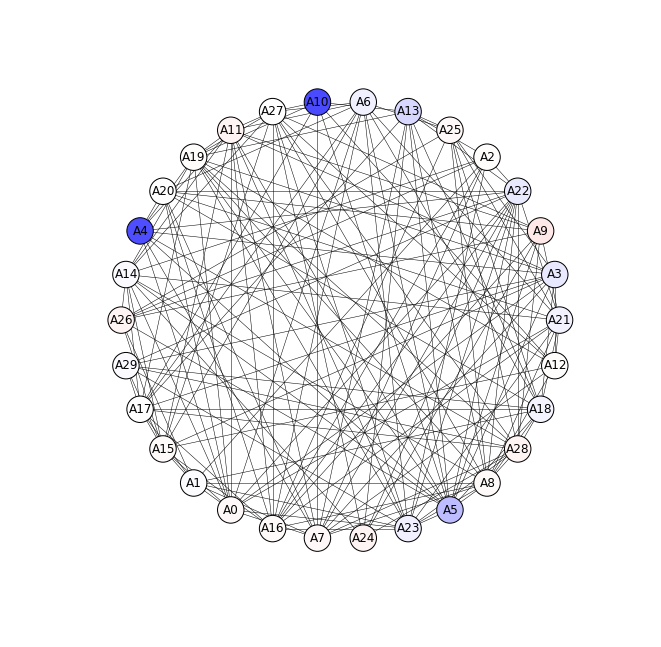

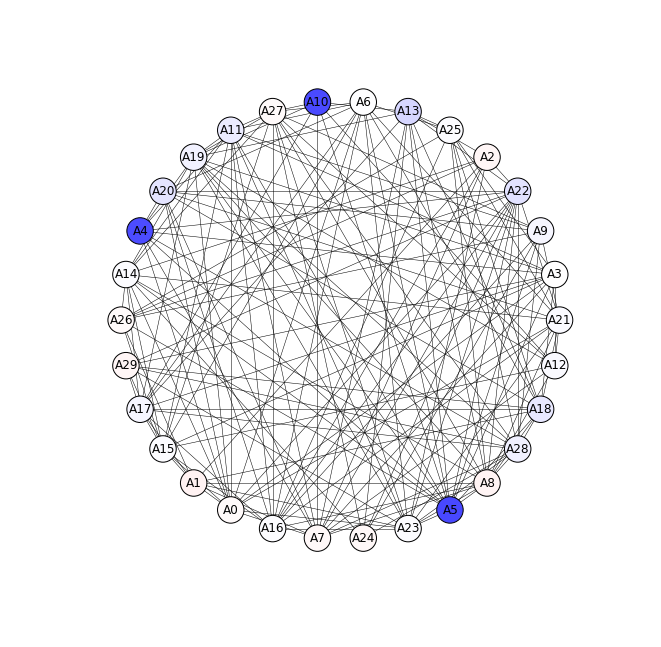

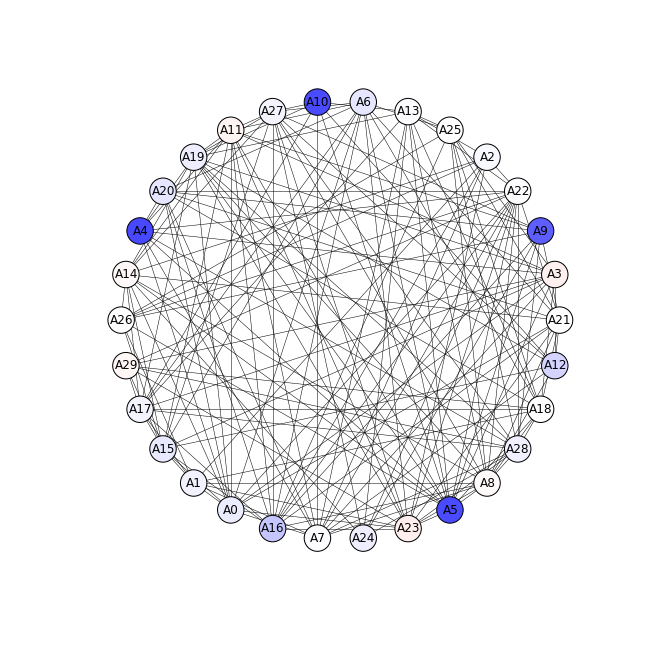

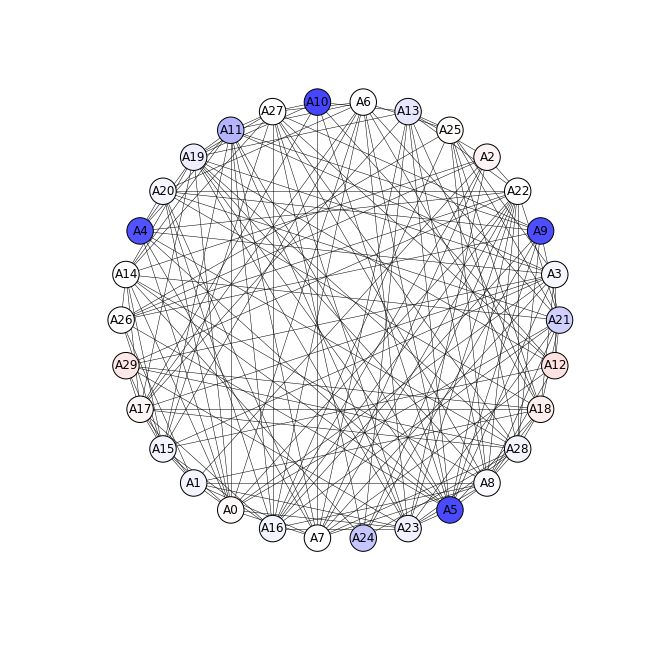

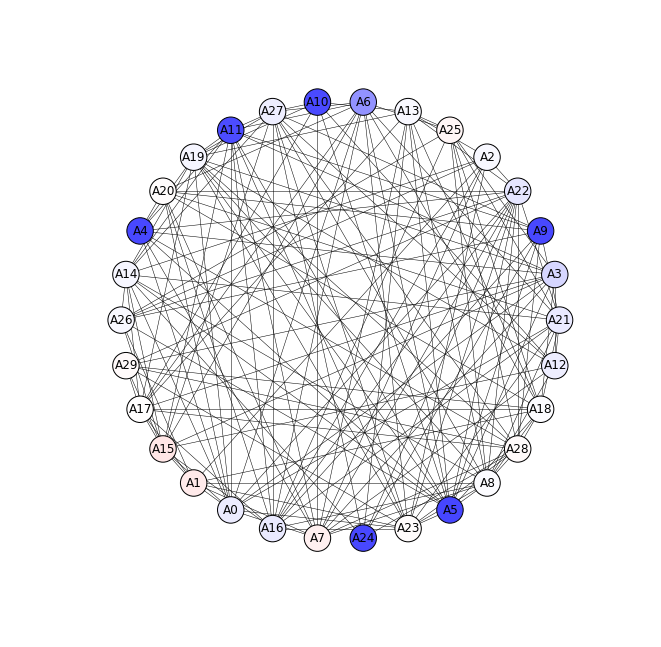

...

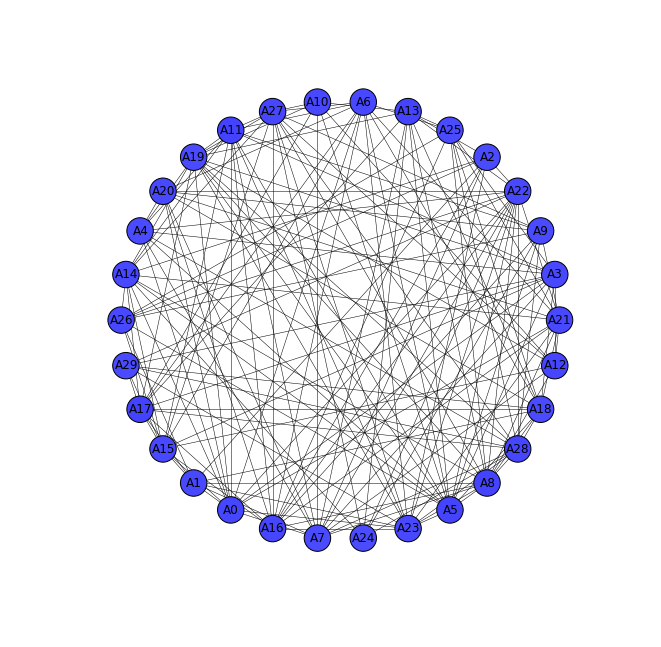

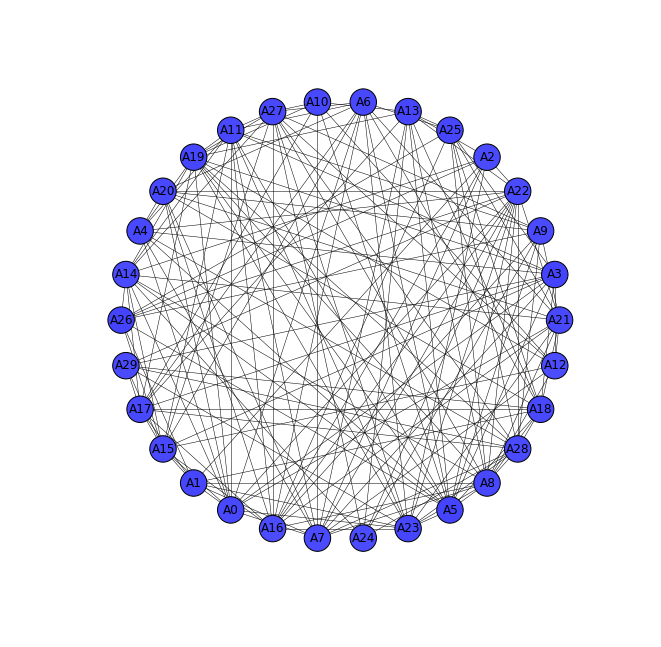

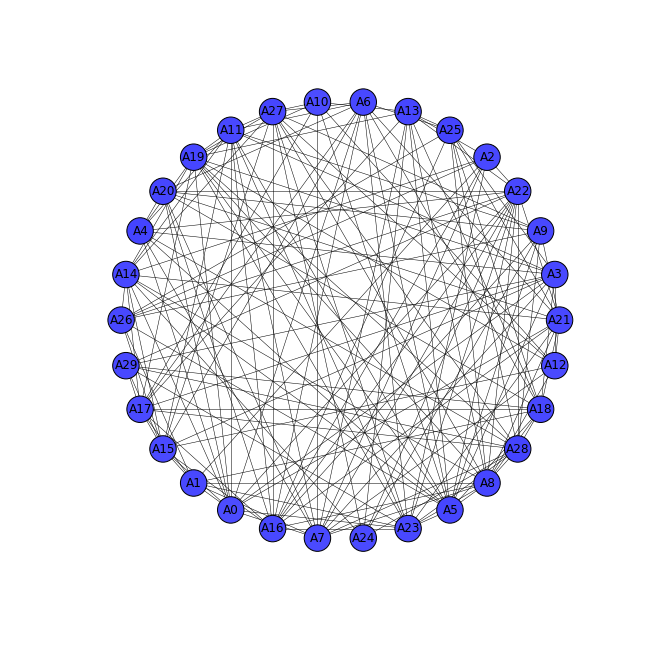

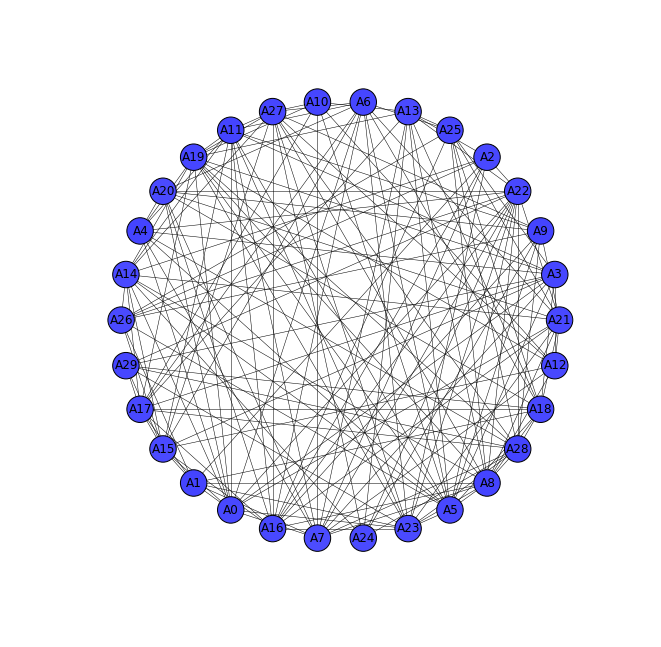

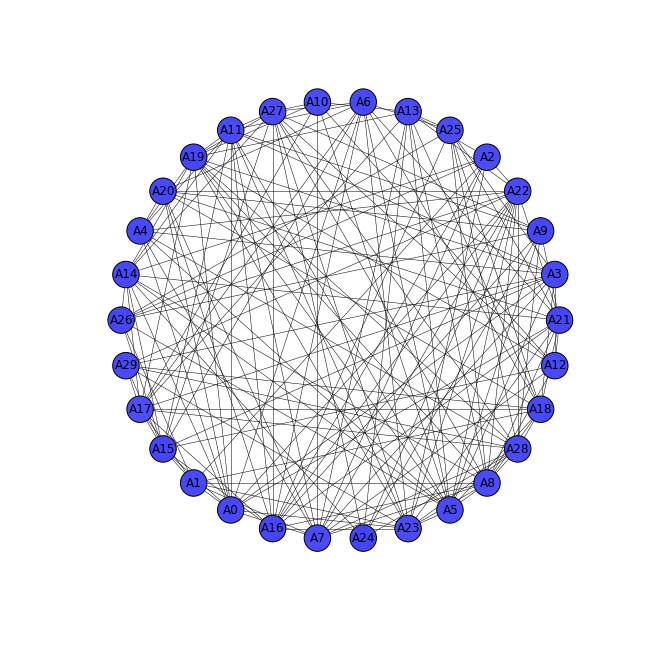

In [38]:
for filename in sorted(time_files)[2:52]:
    plot_graph(filename, True)

In [36]:
nx.degree_centrality(G)

NameError: name 'G' is not defined

In [ ]:
nx.betweenness_centrality(G)

In [ ]:
sorted(nx.betweenness_centrality(G), key=nx.betweenness_centrality(G).get)

In [39]:
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d
import os, sys
import numpy as np

def make_gif(files,output,delay=100, repeat=True,**kwargs):
    """
    Uses imageMagick to produce an animated .gif from a list of
    picture files.
    """
     
    loop = -1 if repeat else 0
    os.system('convert -delay %d -loop %d %s %s'
              %(delay,loop," ".join(files),output))

In [40]:
import glob

files = sorted(glob.glob('*.png'))
print(files)
make_gif(files, 'network-0-50.gif', delay=50)

['0001.png', '0002.png', '0003.png', '0004.png', '0005.png', '0006.png', '0007.png', '0008.png', '0009.png', '0010.png', '0011.png', '0012.png', '0013.png', '0014.png', '0015.png', '0016.png', '0017.png', '0018.png', '0019.png', '0020.png', '0021.png', '0022.png', '0023.png', '0024.png', '0025.png', '0026.png', '0027.png', '0028.png', '0029.png', '0030.png', '0031.png', '0032.png', '0033.png', '0034.png', '0035.png', '0036.png', '0037.png', '0038.png', '0039.png', '0040.png', '0041.png', '0042.png', '0043.png', '0044.png', '0045.png', '0046.png', '0047.png', '0048.png', '0049.png', '0050.png']
